# PW 1 - Markovian models  
Sampling of Markovian models.

The aim of this session is to program the Gibbs sampler algorithm and study it in the binary case.

In this section we consider a binary Markov random field (taking values in $E=\{0,1\}$).
The neighborhood is defined in 4-connexity and the potential of a clique of order 2 is defined by :
$U_c(0,1)=U_c(1,0)=+\beta$ and $U_c(1,1)=U_c(0,0)=0$ (the potential for singleton clique is 0).


In [1]:
import math
import random
import numpy as np
import platform
import tempfile
import os
import matplotlib.pyplot as plt
import imageio
from scipy import ndimage as ndi

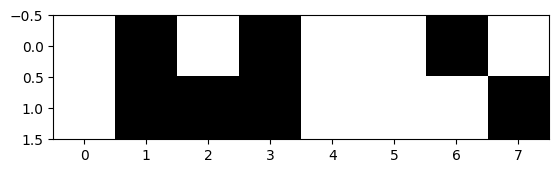

In [2]:
plt.set_cmap('gray')

sh=[2,8]

imaU=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(imaU)

#Q1
For the Ising model defined above, and the imaU generated in the previous cell, give the formula of the global energy and give its value as a function of $\beta$ for imaU.



#A1
$U(x) = 9 \beta$


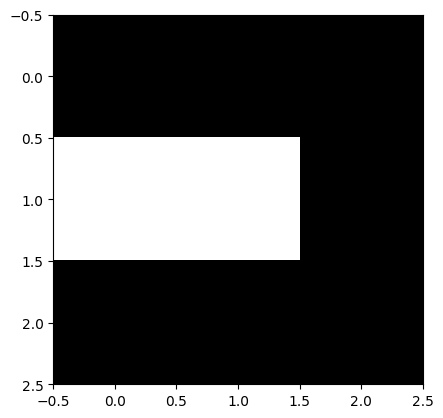

In [3]:
sh=[3,3]

imaVois=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(imaVois)

#Q2

Write the general form of the local conditional probability in a pixel $s$. For the neighborhood configuration imaVois generated by the previous code cell, compute the 2 local conditional energies (for the value 0 and for the value 1 of the central pixel), then the local conditional probabilities (as a function of $\beta$). What is the most probable class ? (NB: do the calculation for an 8-neighborhood).


#A2


## Part 1

Programming the Gibbs sampler and drawing samples of Markovian models



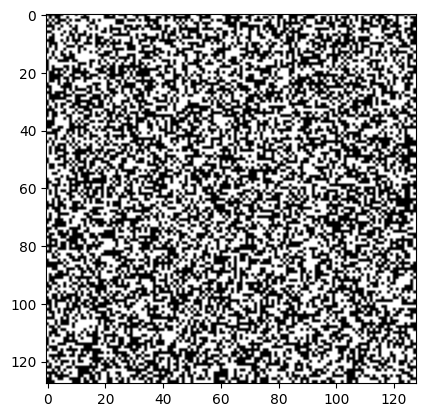

In [4]:
plt.set_cmap('gray')

sh=[128,128]

im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

### Sampling function
Complete the following function which takes as input a binary image (which will be updated by Gibbs sampling) and the value of the regularization parameter.


In [6]:
def echan(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # complete the calculation of energies and associated probabilities
        # energy and non-normalized proba when the pixel is put in class 0
            indice = [[i,j1],[i,j2],[i1,j],[i2,j]]
            somme = 0
            for p in indice:
                r = p[0]
                s = p[1]
                if im_bin[r][s]==1:
                    somme +=1
            Ureg0= somme*beta_reg
            p0=math.exp(-Ureg0);

        # energy and non-normalized proba when the pixel is put in class 1
            indice = [[i,j1],[i,j2],[i1,j],[i2,j]]
            somme = 0
            for p in indice:
                r = p[0]
                s = p[1]
                if im_bin[r][s]==0:
                    somme +=1
            Ureg1=somme*beta_reg
            p1=math.exp(-Ureg1);

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]=0
                else :
                    im_bin[i,j]=1

    return im_bin


By varying the value of the regularization parameter and restarting the cell, observe. You can remove the visualization during sampling and increase the number of iterations

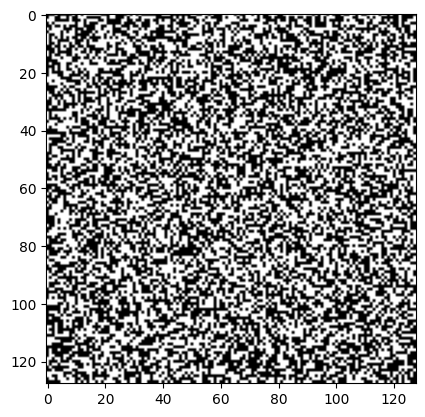

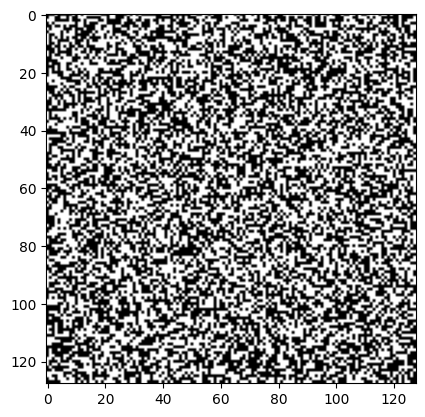

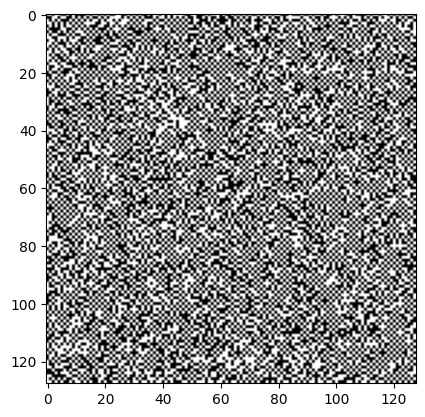

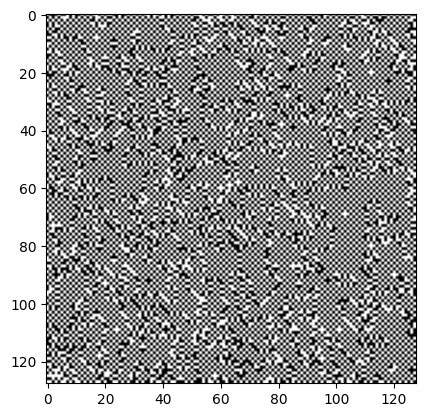

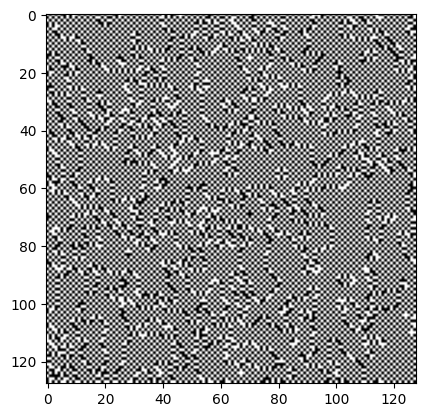

...

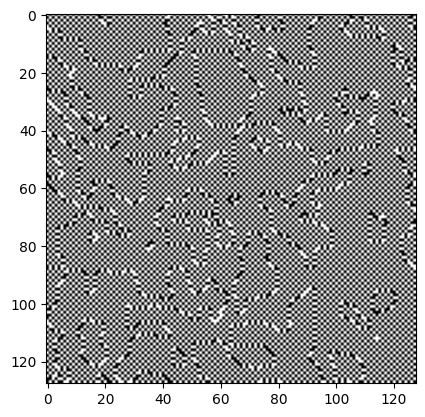

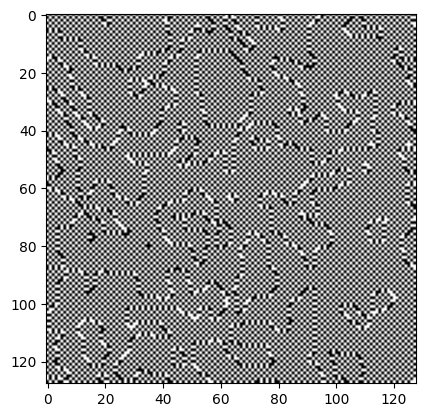

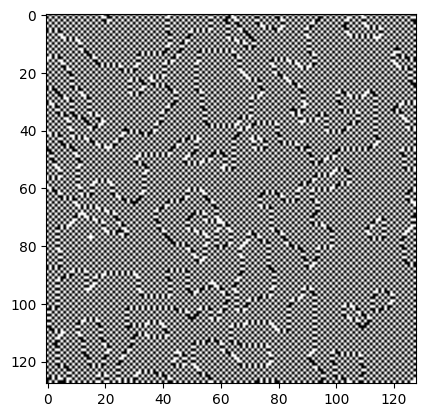

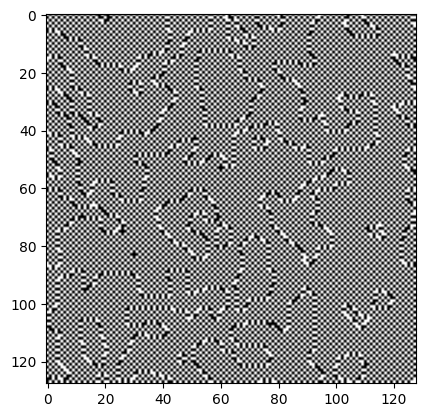

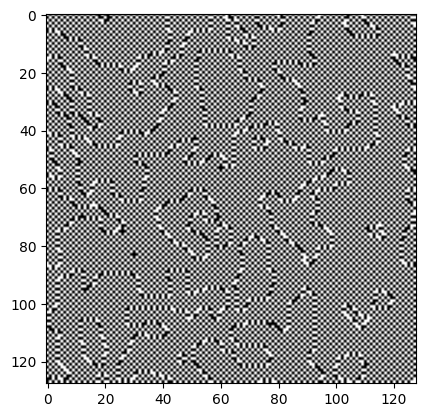

In [7]:

# random initialization of im_bin
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg=-3

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan(im_bin,beta_reg)
    plt.imshow(im_bin)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

#Q3
Run the program several times. Do you still get the same image? Comment on this.

#A3

On n'obtient pas la même image dû à la génération aléatoire de l'image de base

#Q4

Vary $\beta$ from 0.5 to 20. Comment on the results.

#A4

#Q5
Which image minimizes the overall energy for this model?

#A5
An all-white or all-black image.

#Q6
Change 𝛽 and give it a negative value. Describe the result and justify it.

In [ ]:
Si beta prend une valeur négatif, alors pour chaques pixels on cherche à maximiser l'énergie, un pixel a plus de chance de prendre la valeur inverse des pixels qui l'entourent.
Ainsi on obtient une figure en damier avec des irrégularités qui serpentent.

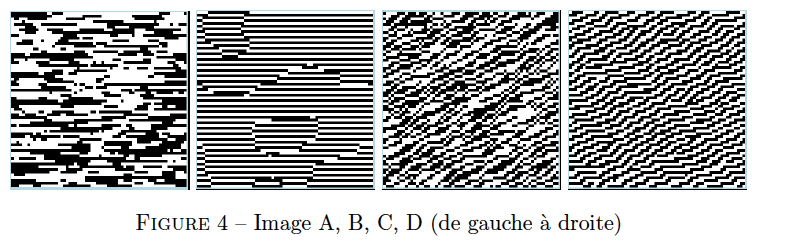

#Q7
We now work in 8-neighborhood, but still with cliques of order 2 (non-isotropic this time). For each of the following images, propose the clique potentials that allow us to obtain these realizations. Initially all clique potentials are zero.


* Image A : there is only one clique potential of order 2 which is -1.
* Image B : in addition to the previous one, there is a clique potential of order 2 which is 1. Indicate which one.
* Image C: in addition to the 2 previous ones, there is a clique potential of order 2 which is -1. Indicate which one.
* Image D: in addition to the 3 previous ones, there is a second order clique potential which is +1. Indicate which one.





#A7


In [8]:
# Essai de réponse à la question 7 en utilisant le même principe que le fonction echange.


def echan2(im_bin,beta_vert10,beta_vert00,beta_ho10,beta_ho00,diag1_01,diag1_00,diag2_01,diag2_00): # On redéfinit la fonction echan

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]

        # energy and non-normalized proba when the pixel is put in class 0
            Ureg0 = 0
            Ureg1 = 0
            if im_bin[i1][j]==1:
                Ureg0 += beta_vert10
                Ureg1 += beta_vert00
            if im_bin[i2][j]==1:
                Ureg0 +=beta_vert10
                Ureg1 +=beta_vert00
            if im_bin[i][j1]==1:
                Ureg0 +=beta_ho10
                Ureg1 +=beta_ho00
            if im_bin[i][j2]==1:
                Ureg0 +=beta_ho10
                Ureg1 +=beta_ho00
            
            if im_bin[i1][j1]==1:
                Ureg0 +=diag2_01
                Ureg1 +=diag2_00
            if im_bin[i1][j2]==1:
                Ureg0 +=diag1_01
                Ureg1 +=diag1_00
            if im_bin[i2][j1]==1:
                Ureg0 +=diag1_01
                Ureg1 +=diag1_00
            if im_bin[i2][j2]==1:
                Ureg0 +=diag2_01
                Ureg1 +=diag2_00

            


            if im_bin[i1][j]==0:
                Ureg0 += beta_vert00
                Ureg1 += beta_vert10
            if im_bin[i2][j]==0:
                Ureg0 +=beta_vert00
                Ureg1 +=beta_vert10
            if im_bin[i][j1]==0:
                Ureg0 +=beta_ho00
                Ureg1 +=beta_ho10
            if im_bin[i][j2]==0:
                Ureg0 +=beta_ho00
                Ureg1 +=beta_ho10
            
            if im_bin[i1][j1]==0:
                Ureg0 +=diag2_00
                Ureg1 +=diag2_01
            if im_bin[i1][j2]==0:
                Ureg0 +=diag1_00
                Ureg1 +=diag1_01
            if im_bin[i2][j1]==0:
                Ureg0 +=diag1_00
                Ureg1 +=diag1_01
            if im_bin[i2][j2]==0:
                Ureg0 +=diag2_00
                Ureg1 +=diag2_01



# energy and non-normalized proba when the pixel is put in class 1
            

            p1=math.exp(-Ureg1);
            p0=math.exp(-Ureg0);

        # sampling according to the normalized probabilities. NB: the normalization is done here
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]=0
                else :
                    im_bin[i,j]=1

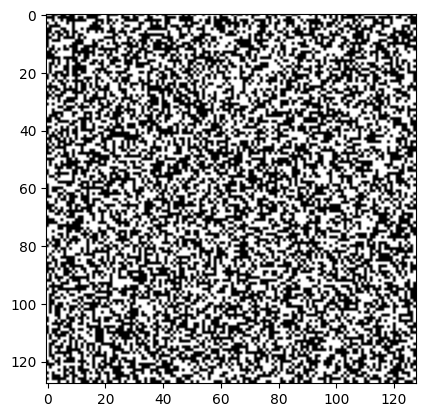

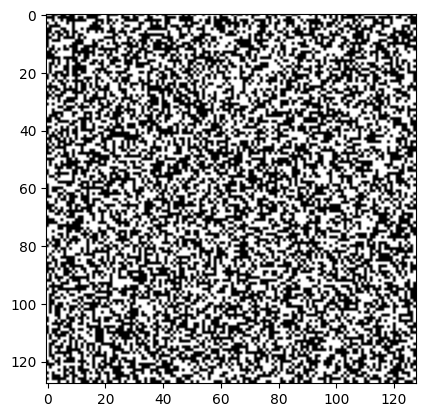

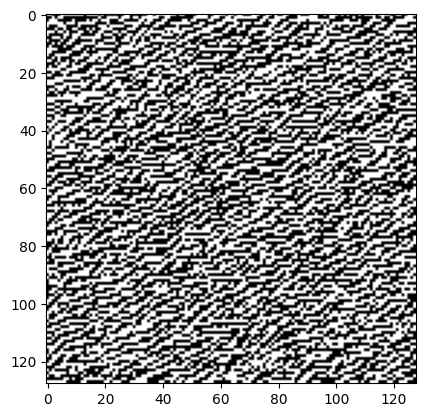

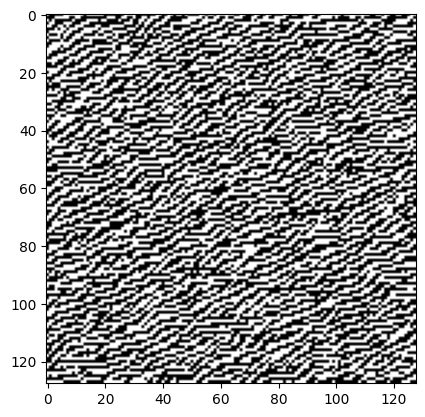

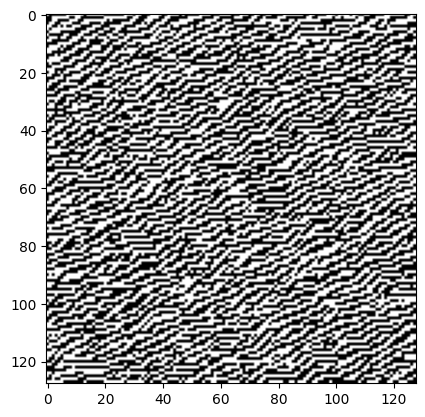

...

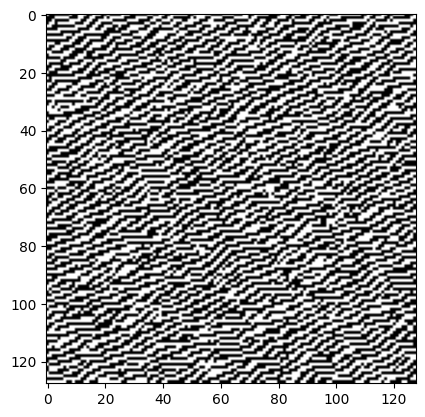

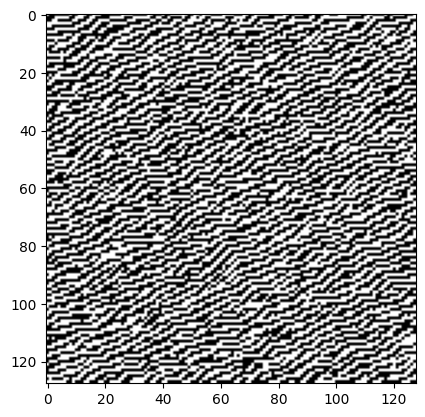

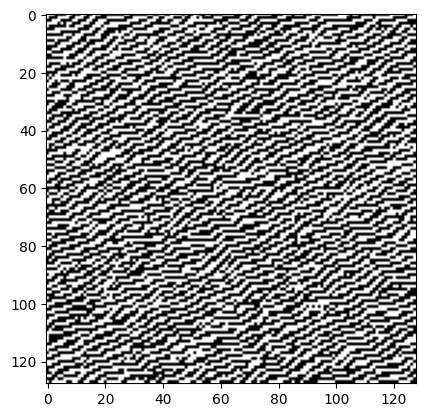

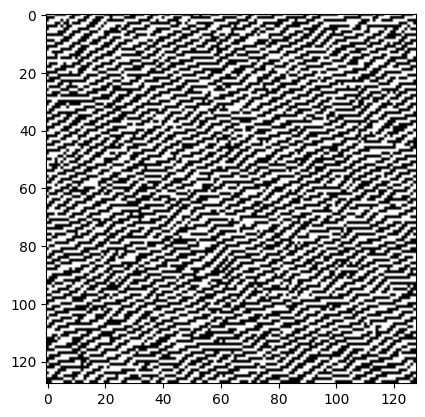

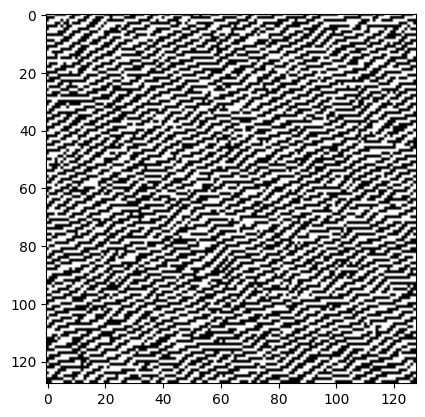

In [18]:
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg=-3

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(10):
    echan2(im_bin,0,1,0,-1,0,-1,0,1)    # A noté que par rapport au support papier on a inversé les positions verticales et horyzontales
    plt.imshow(im_bin)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

#Q8

Modify your program to define an Ising model with a diagonal attractive potential only (the other potentials are zero). It means that this model **encourages** similar labels (either 0 or 1) for neighboring pixels in the diagonal directions ($\pi/4$ or $3\pi/4$ directions). Comment on the result.

In [43]:
def echan_ising(im_bin,beta_reg):

    i=0;
    j=0;

    for i in range(im_bin.shape[0]):
        for j in range(im_bin.shape[1]):
          # do not change these indices
          # they allow access to neighboring pixels
          # i1,j and i2,j and i,j1 and i,j2
            i1=(i-1)%im_bin.shape[0]
            i2=(i+1)%im_bin.shape[0]
            j1=(j-1)%im_bin.shape[1]
            j2=(j+1)%im_bin.shape[1]
            indices_list = [[i1,j1],[i1,j2],[i2,j1],[i2,j2]]

        
            Ureg0= 0
            
            for elem in indices_list:
              a = elem[0]
              b=elem[1]
              if(im_bin[a][b]==1):
                Ureg0+=beta_reg
            p0=math.exp(-1*Ureg0);

        
            Ureg1=0


            for elem in indices_list:
              a = elem[0]
              b=elem[1]
              if(im_bin[a][b]==0):
                Ureg1+=beta_reg
            p1=math.exp(-1*Ureg1);

        
            if (p0+p1!=0.):
                if(random.uniform(0,1)<p0/(p0+p1)):
                    im_bin[i,j]=0
                else :
                    im_bin[i,j]=1

    return im_bin

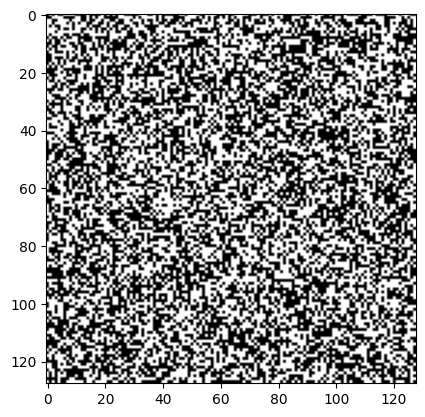

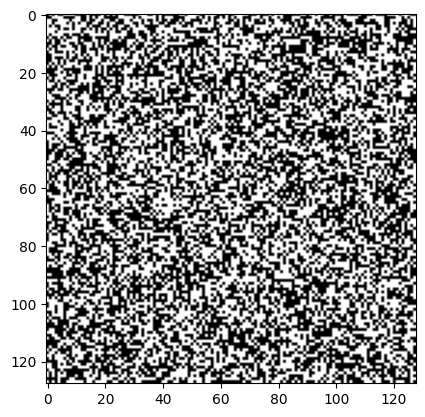

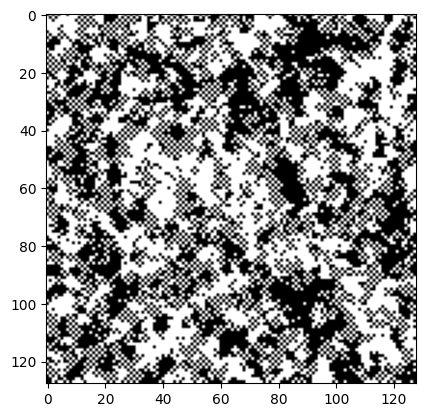

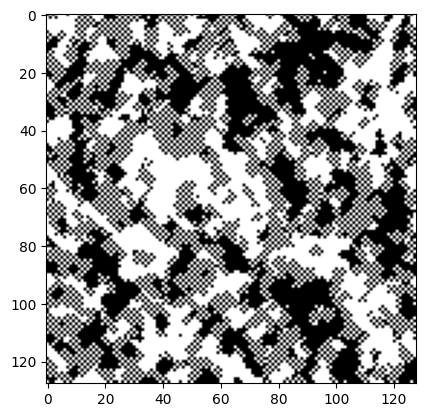

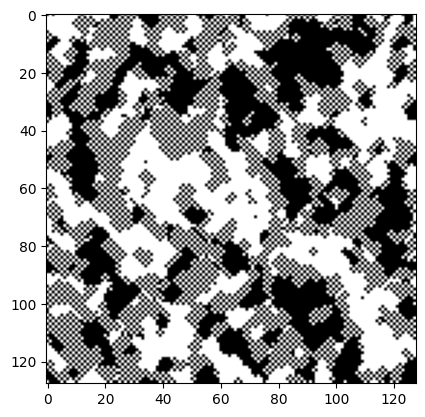

...

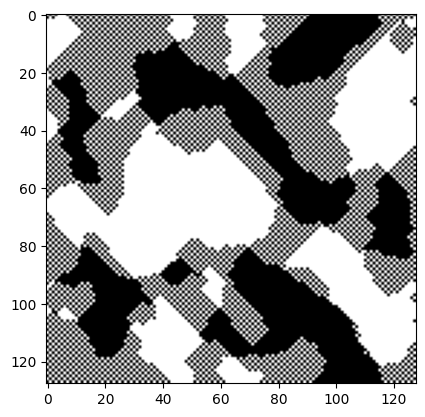

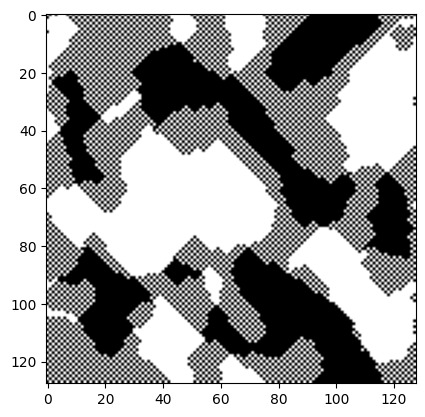

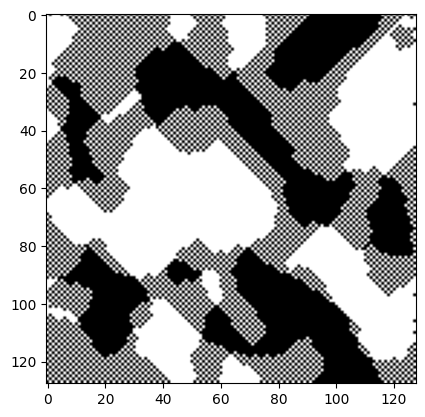

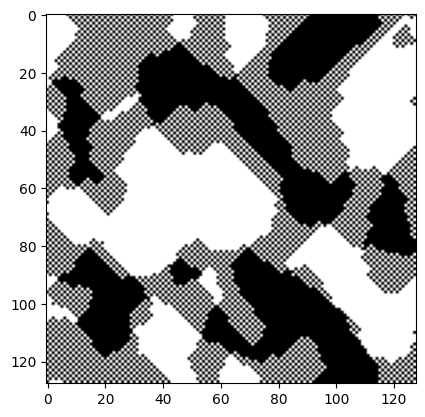

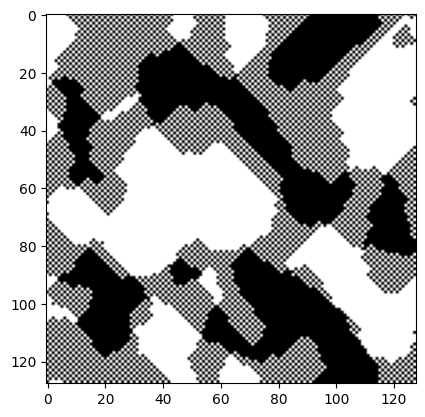

In [44]:
plt.set_cmap('gray')
sh=[128,128]
im_bin=2-np.ceil(2*np.random.rand(*sh))
plt.imshow(im_bin)

beta_reg=20

mafigure=plt.figure()
plt.imshow(im_bin);
mafigure.canvas.draw()
plt.show()

for n in range(30):
    echan_ising(im_bin,beta_reg)
    plt.imshow(im_bin)
    mafigure.canvas.draw()
    plt.show(block=False)


plt.figure()
plt.imshow(im_bin)
plt.show()

#A8     Réponse 